In [5]:
#data training using cross-val and grid search
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.linear_model import Ridge, ElasticNet
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score, mean_squared_error
from sklearn.model_selection import train_test_split, cross_validate,cross_val_score,GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [6]:
df = pd.read_csv("cancer_stat.csv")

In [9]:
df.head()

,avganncount,avgdeathsperyear,target_deathrate,incidencerate,medincome,popest2015,povertypercent,studypercap,binnedinc,medianage,...,pctprivatecoveragealone,pctempprivcoverage,pctpubliccoverage,pctpubliccoveragealone,pctwhite,pctblack,pctasian,pctotherrace,pctmarriedhouseholds,birthrate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [11]:
len(df.columns)

33

In [58]:
df.columns

Index(['avgdeathsperyear', 'target_deathrate', 'incidencerate', 'medincome',
       'povertypercent', 'medianage', 'medianagemale', 'medianagefemale',
       'pctnohs18_24', 'pcths18_24', 'pctsomecol18_24', 'pctbachdeg18_24',
       'pcths25_over', 'pctbachdeg25_over', 'pctemployed16_over',
       'pctunemployed16_over', 'pctprivatecoverage', 'pctprivatecoveragealone',
       'pctempprivcoverage', 'pctpubliccoverage', 'pctpubliccoveragealone',
       'pctwhite', 'pctblack', 'pctasian', 'pctmarriedhouseholds',
       'birthrate'],
      dtype='object')

In [56]:
dropcols=['avganncount','binnedinc','geography','pctotherrace','studypercap','popest2015','percentmarried']
df=df.drop(dropcols,axis=1)

In [25]:
#df.info()

In [15]:
sns.set_context("talk", font_scale=1.1)

In [27]:
# Relationships between features
sns.pairplot(data=df,diag_kind='kde',hue='target_deathrate')

In [81]:
#remove columns 
dropcolumns=['pctsomecol18_24','pctemployed16_over','pctprivatecoveragealone']
df= df.drop(dropcolumns,axis=1)

In [83]:
df.isnull().sum()

avgdeathsperyear          0
target_deathrate          0
incidencerate             0
medincome                 0
povertypercent            0
medianage                 0
medianagemale             0
medianagefemale           0
pctnohs18_24              0
pcths18_24                0
pctbachdeg18_24           0
pcths25_over              0
pctbachdeg25_over         0
pctunemployed16_over      0
pctprivatecoverage        0
pctempprivcoverage        0
pctpubliccoverage         0
pctpubliccoveragealone    0
pctwhite                  0
pctblack                  0
pctasian                  0
pctmarriedhouseholds      0
birthrate                 0
dtype: int64

In [85]:
scaler = MinMaxScaler()

In [87]:
# Normalize the DataFrame
df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

In [89]:
#get %
100* df.isnull().sum() / len(df)

avgdeathsperyear          0.0
target_deathrate          0.0
incidencerate             0.0
medincome                 0.0
povertypercent            0.0
medianage                 0.0
medianagemale             0.0
medianagefemale           0.0
pctnohs18_24              0.0
pcths18_24                0.0
pctbachdeg18_24           0.0
pcths25_over              0.0
pctbachdeg25_over         0.0
pctunemployed16_over      0.0
pctprivatecoverage        0.0
pctempprivcoverage        0.0
pctpubliccoverage         0.0
pctpubliccoveragealone    0.0
pctwhite                  0.0
pctblack                  0.0
pctasian                  0.0
pctmarriedhouseholds      0.0
birthrate                 0.0
dtype: float64

In [91]:
df_norm.head()

,avgdeathsperyear,target_deathrate,incidencerate,medincome,povertypercent,medianage,medianagemale,medianagefemale,pctnohs18_24,pcths18_24,...,pctunemployed16_over,pctprivatecoverage,pctempprivcoverage,pctpubliccoverage,pctpubliccoveragealone,pctwhite,pctblack,pctasian,pctmarriedhouseholds,birthrate
0,0.033269,0.347080,0.286893,0.381164,0.180995,0.028253,0.342790,0.447005,0.179407,0.544828,...,0.262069,0.754286,0.491259,0.402597,0.259091,0.797112,0.030190,0.113138,0.542157,0.286917
1,0.004783,0.335203,0.209129,0.247459,0.348416,0.017783,0.231678,0.262673,0.095164,0.308966,...,0.255172,0.684286,0.526224,0.369202,0.288636,0.880051,0.011275,0.052704,0.406297,0.203182
2,0.003355,0.379413,0.147574,0.259314,0.257919,0.037726,0.510638,0.541475,0.374415,0.504828,...,0.227586,0.591429,0.374126,0.573284,0.420455,0.898912,0.008606,0.010932,0.571001,0.174879
3,0.014207,0.445727,0.227824,0.209748,0.314480,0.034070,0.468085,0.486175,0.315133,0.568276,...,0.403448,0.515714,0.375874,0.632653,0.509091,0.908071,0.009106,0.027250,0.508852,0.215878
4,0.001642,0.279446,0.147971,0.265207,0.210407,0.043211,0.600473,0.612903,0.232449,0.593103,...,0.151724,0.561429,0.377622,0.608534,0.456818,0.934344,0.003144,0.015623,0.563423,0.318700


In [93]:
def percent_missing(df):
    percent_nan = 100* df.isnull().sum() / len(df)
    percent_nan = percent_nan[percent_nan>0].sort_values()
    return percent_nan

In [95]:
percent_nan = percent_missing(df_norm)

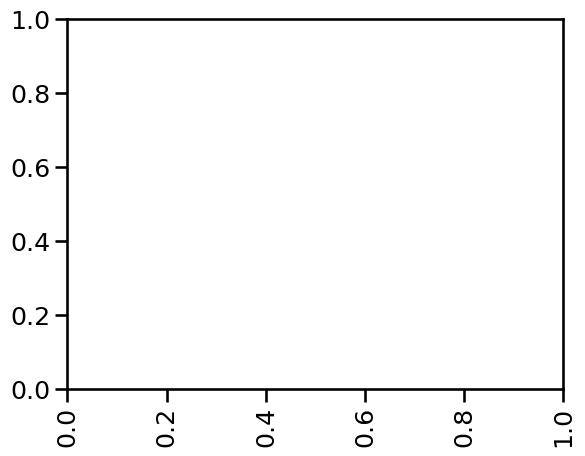

In [97]:
#visualize
sns.barplot(x=percent_nan.index,y=percent_nan)
plt.xticks(rotation=90);

In [99]:
df_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   avgdeathsperyear        3047 non-null   float64
 1   target_deathrate        3047 non-null   float64
 2   incidencerate           3047 non-null   float64
 3   medincome               3047 non-null   float64
 4   povertypercent          3047 non-null   float64
 5   medianage               3047 non-null   float64
 6   medianagemale           3047 non-null   float64
 7   medianagefemale         3047 non-null   float64
 8   pctnohs18_24            3047 non-null   float64
 9   pcths18_24              3047 non-null   float64
 10  pctbachdeg18_24         3047 non-null   float64
 11  pcths25_over            3047 non-null   float64
 12  pctbachdeg25_over       3047 non-null   float64
 13  pctunemployed16_over    3047 non-null   float64
 14  pctprivatecoverage      3047 non-null   

In [101]:
df_norm.corr()['target_deathrate'].sort_values()

pctbachdeg25_over        -0.485477
medincome                -0.428615
pctprivatecoverage       -0.386066
pctmarriedhouseholds     -0.293325
pctbachdeg18_24          -0.287817
pctempprivcoverage       -0.267399
pctasian                 -0.186331
pctwhite                 -0.177400
avgdeathsperyear         -0.090715
birthrate                -0.087407
medianagemale            -0.021929
medianage                 0.004375
medianagefemale           0.012048
pctnohs18_24              0.088463
pctblack                  0.257024
pcths18_24                0.261976
pctunemployed16_over      0.378412
pctpubliccoverage         0.404572
pcths25_over              0.404589
povertypercent            0.429389
pctpubliccoveragealone    0.449358
incidencerate             0.449432
target_deathrate          1.000000
Name: target_deathrate, dtype: float64

In [103]:
## cross validation with cross_val_score
X = df_norm.drop('target_deathrate',axis=1)
y = df_norm['target_deathrate']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

#scaler = StandardScaler()
#scaler.fit(X_train)
#X_train = scaler.transform(X_train)
#X_test = scaler.transform(X_test)

In [105]:
model = Ridge(alpha=1)  #regularization prevents overfitting by adding a penalty to the loss function

In [107]:
scores = cross_val_score(model,X_train,y_train,
                         scoring='neg_mean_squared_error',cv=5)

In [109]:
scores

array([-0.00465587, -0.0052518 , -0.00465006, -0.00397897, -0.00379325])

In [111]:
abs(scores.mean())

0.004465988966584218

In [113]:
model.fit(X_train,y_train)

Ridge(alpha=1)

In [115]:
y_pred = model.predict(X_test)

In [117]:
mean_squared_error(y_test,y_pred)

0.004041178563658337

In [119]:
######################### now with cross_validate

In [121]:
model = Ridge(alpha=1)

In [123]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [125]:
#scoring options # https://scikit-learn.org/stable/modules/model_evaluation.html
scores = cross_validate(model,X_train,y_train,
                         scoring=['neg_mean_absolute_error','neg_mean_squared_error','max_error'],cv=5)

In [127]:
dfscores=pd.DataFrame(scores)
dfscores.head()

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error,test_max_error
0,0.004218,0.011730,-0.050256,-0.004656,-0.306791
1,0.003370,0.001520,-0.053499,-0.005252,-0.467064
2,0.002531,0.004596,-0.052666,-0.004650,-0.209678
3,0.002801,0.001894,-0.046345,-0.003979,-0.232630
4,0.003389,0.001244,-0.045978,-0.003793,-0.236844


In [129]:
dfscores.mean()

fit_time                        0.003262
score_time                      0.004197
test_neg_mean_absolute_error   -0.049749
test_neg_mean_squared_error    -0.004466
test_max_error                 -0.290601
dtype: float64

In [131]:
model.fit(X_train,y_train)

Ridge(alpha=1)

In [133]:
y_pred = model.predict(X_test)

In [135]:
mean_squared_error(y_test,y_pred)

0.004041178563658337

In [137]:
#help(ElasticNet)

In [139]:
base_elastic_model = ElasticNet()

In [141]:
param_grid = {'alpha':[0.1,1,5,10,50,100],
              'l1_ratio':[.1, .5, .7, .9, .95, .99, 1]}

In [143]:
grid_model = GridSearchCV(estimator=base_elastic_model,
                          param_grid=param_grid,
                          scoring='neg_mean_squared_error',
                          cv=10,
                          verbose=1)

In [145]:
grid_model.fit(X_train,y_train)

Fitting 10 folds for each of 42 candidates, totalling 420 fits


GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [0.1, 1, 5, 10, 50, 100],
                         'l1_ratio': [0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1]},
             scoring='neg_mean_squared_error', verbose=1)

In [147]:
grid_model.best_estimator_

ElasticNet(alpha=0.1, l1_ratio=0.1)

In [149]:
grid_model.best_params_

{'alpha': 0.1, 'l1_ratio': 0.1}

In [151]:
gridresults= pd.DataFrame(grid_model.cv_results_)

In [153]:
y_pred = grid_model.predict(X_test)

In [155]:
mean_squared_error(y_test,y_pred)

0.008537541235292106